## Helper Functions

In [1]:
def pred_and_plot(model, directory, class_names):
  """
  predicts and plots n images located at directory, makes a prediction on them with
  a trained model and plots the image with the predicted class as the title.
  """
  # Import the target images and preprocess them
  imgs = load_and_prep_images(directory)

  # Read in the images and plot it using matplotlib
  fig, axs = plt.subplots(1, len(imgs), figsize=(15, 15))
  for i, ax in enumerate(axs.flatten()):
      # Make a prediction
      pred = model.predict(tf.expand_dims(imgs[i], axis=0))

      # Get the predicted class
      if len(pred[0]) > 1: # check for multi-class
        pred_class = class_names[pred.argmax()] # if more than one output, take the max
      else:
        pred_class = class_names[int(tf.round(pred)[0][0])] # if only one output, round

      plt.sca(ax)
      # Plot the image and predicted class
      plt.imshow(imgs[i])
      plt.title(f"Prediction: {pred_class}")
      plt.axis(False)

In [2]:
# Create a function to import an image and resize it to be able to be used with our model
def load_and_prep_images(file_dir, img_shape=150, n_samples=5):
  """
  Reads in n_samples images from directory file_dir, turns it into a tensor
  and reshapes it to (img_shape, img_shape, colour_channel).
  """

  
  #sample n images from target folder
  target_folder = file_dir
  sample_images = random.sample(os.listdir(file_dir), n_samples)
  
  imgs=[]


  for image in sample_images:
      # Read in target file (an image)
      img = tf.io.read_file(target_folder + '/' +image)

      # Decode the read file into a tensor & ensure 3 colour channels 
      # (our model is trained on images with 3 colour channels and sometimes images have 4 colour channels)
      img = tf.image.decode_image(img, channels=3)

      # Resize the image (to the same size our model was trained on)
      img = tf.image.resize(img, size = [img_shape, img_shape])

      # Rescale the image (get all values between 0 and 1)
      img = img/255.
    
      imgs.append(img)
  
  return imgs


In [3]:
def eval(model, test_data):
    """
    predict on test data return
    
    true labels and  predictions
    """
    
    #predict on the test data with model
    y_probs = model.predict(test_data)
    #convert from prob tensor to labels
    y_preds= y_probs.argmax(axis=1)
    
    #get the true labels from ImageDataGenerator
    y_true=test_data.classes
    
    return y_true, y_preds

In [4]:
import cv2
import shutil
def resize_to_dir(target_dir, resize_dir, classes, size=150):
    """
    Iterate through list of dataframes(classes) representing n classes of the data
    
    extract and resize all images recorded in each dataframe to size size
    
    copy resized image from current directory to new directory resize_dir
    """
    
    #remove the resize directory if already exists else create the resize_dir
    shutil.rmtree(resize_dir, ignore_errors=True)
    os.makedirs(resize_dir, exist_ok=True)
    
    #track succesfull resizes
    count_resized=0
    total_count=0
    
    #iterate through all classes
    for class_df in classes:
        #get the class name from first record in dataframe
        class_name=class_df['class_name'].iloc[0]
        
        #get the class folder location from class name
        target_folder = os.path.join(target_dir, class_name)
        
        #create the new path for resized images in the class
        resize_path=os.path.join(resize_dir, class_name)
        
        #make a new directory in resize path for this class
        os.makedirs(resize_path, exist_ok=True)
        
        # go through all images in this class
        for i, row in class_df.iterrows():
            #update total count
            total_count+=1
            
            #get the image name
            filename=row['filename']
            #create the image path from name
            path = os.path.join(target_folder,filename)
            #read the image
            img=cv2.imread(path)
            #create new size for image
            dimension=(size,size)
            #resize the image and copy to resize directory catch bad files
            try:
                #resize the image
                resized=cv2.resize(img,dimension,interpolation=cv2.INTER_AREA)
                #rename the image
                new_name='resized_{}'.format(filename)
                #write image to file
                cv2.imwrite(new_name,resized)
                #copy image to new resize direcotry
                src=new_name
                dst=resize_path + "/" + new_name
                shutil.copy2(src, dst)
                os.remove(new_name)
                count_resized+=1
            except Exception as e:
                #catch and skip bad files
                print("bad file skipping: "+path)
    
    print('resized {} images out of {} images successfully'.format(count_resized,total_count))
            
            

In [5]:
def sort_and_trim( data, class_names, target_size=150, n_records_per_class=100):
    """
    breaks up a dataframe(data) into n classes
    
    sorts each newly created dataframe by closeness to given size(150)
    
    picks the first n_records of sorted dataframe
    
    returns a list of sorted dataframes
    """
    #list of dataframes one for each class
    sorted_classes=[]
    
    #iterate through classnames
    for class_name in class_names:
        #filter dataframe get all records corresponding to class_name
        x=data.loc[data['class_name']==class_name]
        #select the first n_records closest to given size
        x=x.sort_values(by='w', key=lambda w: abs(target_size-w)).head(n_records_per_class)
        #update dataframe list
        sorted_classes.append(x)

    print("created {} dataframes containing {} records each successfully".format(len(class_names), n_records_per_class))
    return sorted_classes

In [6]:
# Note: The following confusion matrix code is a remix of Scikit-Learn's 
# plot_confusion_matrix function - https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_confusion_matrix.html
# and Made with ML's introductory notebook - https://github.com/GokuMohandas/MadeWithML/blob/main/notebooks/08_Neural_Networks.ipynb
import itertools
from sklearn.metrics import confusion_matrix

# Our function needs a different name to sklearn's plot_confusion_matrix
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15): 
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
  
  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  #rotate diagonally to make labels visible
  ax.set_xticklabels(classes, rotation = 45)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
             horizontalalignment="center",
             color="white" if cm[i, j] > threshold else "black",
             size=text_size)

In [7]:
# Function to evaluate: accuracy, precision, recall, f1-score
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

def calculate_results(y_true, y_pred):
  """
  Calculates model accuracy, precision, recall and f1 score of a binary classification model.

  Args:
  -----
  y_true = true labels in the form of a 1D array
  y_pred = predicted labels in the form of a 1D array

  Returns a dictionary of accuracy, precision, recall, f1-score.
  """
  # Calculate model accuracy
  model_accuracy = accuracy_score(y_true, y_pred) * 100
  # Calculate model precision, recall and f1 score using "weighted" average
  model_precision, model_recall, model_f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted")
  model_results = {"accuracy": model_accuracy,
                  "precision": model_precision,
                  "recall": model_recall,
                  "f1": model_f1}
  return model_results

In [8]:
# Plot the validation and training data loss curves separately
def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """ 
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

In [9]:
import shutil
def to_train_test(target_dir, classes, train_dir, test_dir, split, percent_samples):
    """
    Changes the directory structure to work with the tensorflow flow_from_directory function
    
    Creates directory for train test containg samples divided by the given split percentage
    
    percent_samples represents what percentage of all images should be used for training and validation
    
    will create new directories in the form
     
    train
        |
         classes
    test
        |
        classes
    """
    
    #remove the train and test directory if they already exits
    shutil.rmtree(train_dir, ignore_errors=True)
    shutil.rmtree(test_dir, ignore_errors=True)
    
    #create train and test_dir
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    #iterate though classes
    for classname in classes:
        #randomly sample the percentage of all images in the class to be split into training and validation
        target_folder = os.path.join(target_dir, classname)
        n_samples= int(len(os.listdir(target_folder))*percent_samples)
        all_images = random.sample(os.listdir(target_folder), n_samples)

        #create the train and test path for this class
        train_path=os.path.join(train_dir, classname)
        test_path=os.path.join(test_dir, classname)
        os.makedirs(train_path, exist_ok=True)
        os.makedirs(test_path, exist_ok=True)
        
        # copy the selected images to train and test according to given split
        for i, image in enumerate(all_images):
            src=target_folder + "/" + image
            dst=train_path + "/" + image if i < int(split * len(all_images)) else test_path + "/" + image
            shutil.copy2(src, dst)    

In [10]:
# View n random images from given directory
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import os

def plot_random_images(target_dir, target_class, n_samples=5):
    """
    function to sample and plot n random images from a given class
    """
    # Setup target directory (we'll view images from here)
    target_folder = os.path.join(target_dir,target_class)

    # Get all random image path
    random_images=random.sample(os.listdir(target_folder), n_samples)

    # Read in the images and plot it using matplotlib
    fig, axs = plt.subplots(1, n_samples, figsize=(15, 15))
    for i, ax in enumerate(axs.flatten()):
        img = mpimg.imread(target_folder + "/" + random_images[i])
        plt.sca(ax)
        plt.imshow(img)
        plt.title(f"shape: {img.shape}")
        plt.axis('off')
    

    print(target_class)
    plt.show()

# Part 1: Image Classification

### 1.0 Getting the Data

the aim is to read in the data

In [11]:
#constants
#extract to this folder
FOLDER_NAME="animal_faces"
#80% training samples and 20% test sample
IMAGE_SPLIT=0.8

In [12]:
#make sure youre in same directory as file AnimalFace.zip
print(os.getcwd())

C:\Users\Nicholas\Desktop\CCT\sem2\machlearningforAI\computer_vision_+_semantic_analysis


In [13]:
#access and extract all images one by one catch bad files
import zipfile
with zipfile.ZipFile("AnimalFace.zip", "r") as zip_ref:
    for name in zip_ref.namelist():
        try:
            zip_ref.extract(name, FOLDER_NAME)
        except Exception as e:
            print("bad file skipping: {}".format(name))

bad file skipping: Image/EagleHead/gpw-20040603a-UnitedStatesFishAndWildlifeService-WV-10673-CD34-Bald-Eagle-preparing-to-land-on-nest-Kodiak-Island-National-Wildlife-Refuge-Alaska-medium.jpg


all files are good but one filename is too long

In [14]:
import os
#walk through AnimalFace directory and list number of files
for dirpath, dirnames, filenames in os.walk(FOLDER_NAME):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

There are 2 directories and 0 images in 'animal_faces'.
There are 21 directories and 0 images in 'animal_faces\Image'.
There are 0 directories and 101 images in 'animal_faces\Image\BearHead'.
There are 0 directories and 160 images in 'animal_faces\Image\CatHead'.
There are 0 directories and 100 images in 'animal_faces\Image\ChickenHead'.
There are 0 directories and 104 images in 'animal_faces\Image\CowHead'.
There are 0 directories and 103 images in 'animal_faces\Image\DeerHead'.
There are 0 directories and 389 images in 'animal_faces\Image\DogHead'.
There are 0 directories and 103 images in 'animal_faces\Image\DuckHead'.
There are 0 directories and 100 images in 'animal_faces\Image\EagleHead'.
There are 0 directories and 100 images in 'animal_faces\Image\ElephantHead'.
There are 0 directories and 100 images in 'animal_faces\Image\HumanHead'.
There are 0 directories and 102 images in 'animal_faces\Image\LionHead'.
There are 0 directories and 100 images in 'animal_faces\Image\MonkeyHead

there are about 100 images in each class, first problem noticed, imbalance in number of images per class
imbalance in classes can cause model to perform badly or tend to predict the class with largest number of images

In [15]:
dataset_dir=os.path.join(FOLDER_NAME, "Image")
print(dataset_dir)

animal_faces\Image


this is the directory where all classes can be found

### 1.2 Data Visualization

the aim here is to inspect the data visually and find any problems

In [16]:
# Get the class names for our multi-class dataset
import pathlib
import numpy as np
data_dir = pathlib.Path(dataset_dir)
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names, len(class_names))

['BearHead' 'CatHead' 'ChickenHead' 'CowHead' 'DeerHead' 'DogHead'
 'DuckHead' 'EagleHead' 'ElephantHead' 'HumanHead' 'LionHead' 'MonkeyHead'
 'MouseHead' 'Natural' 'PandaHead' 'PigHead' 'PigeonHead' 'RabbitHead'
 'SheepHead' 'TigerHead' 'WolfHead'] 21


BearHead


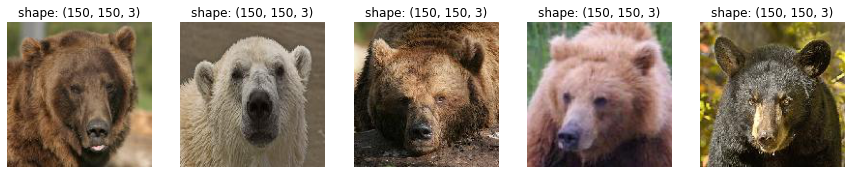

CatHead


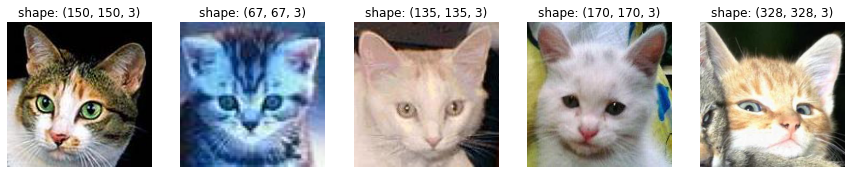

ChickenHead


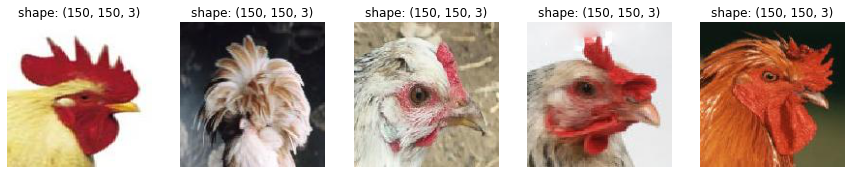

CowHead


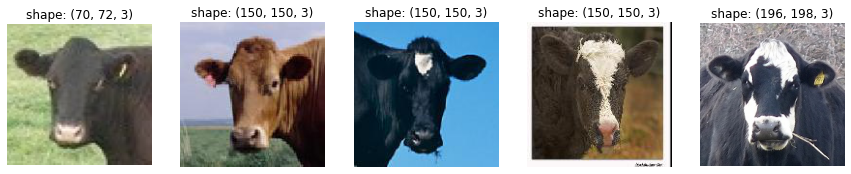

DeerHead


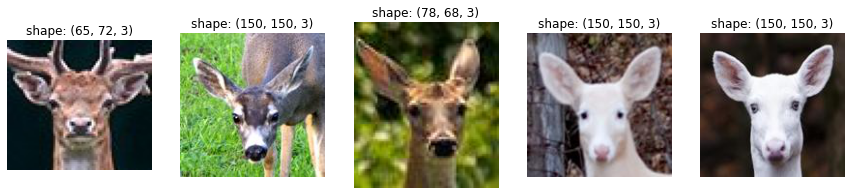

DogHead


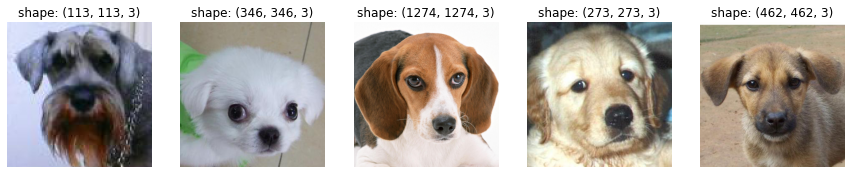

DuckHead


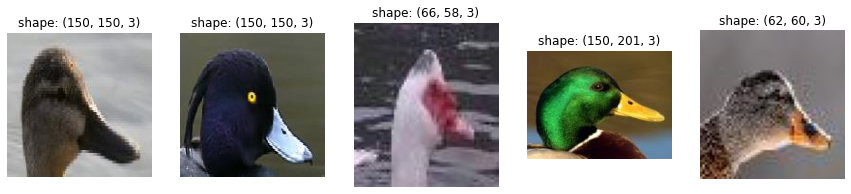

EagleHead


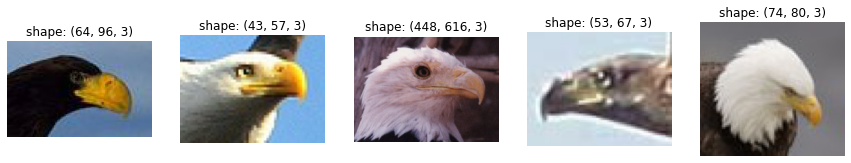

ElephantHead


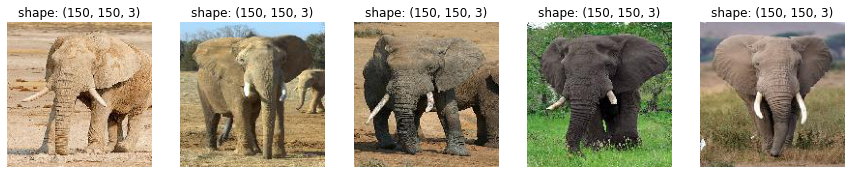

HumanHead


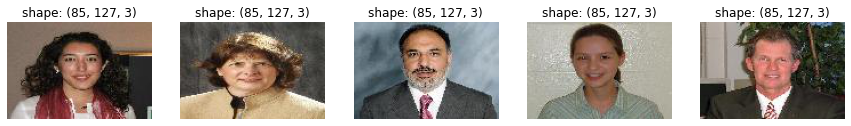

In [17]:
#sample and plot 5 random images for the first 10 classes
for class_name in class_names[:10]:
    plot_random_images(target_dir=dataset_dir,target_class=class_name)

LionHead


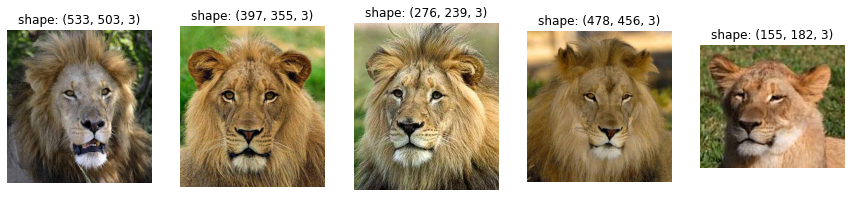

MonkeyHead


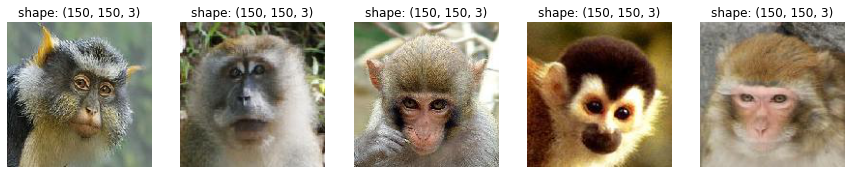

MouseHead


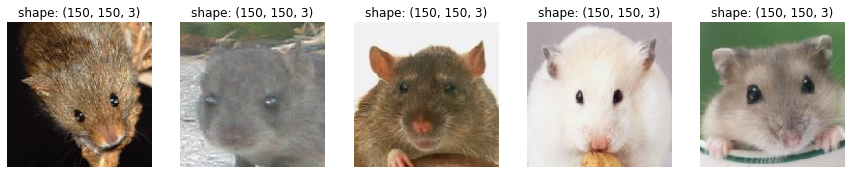

Natural


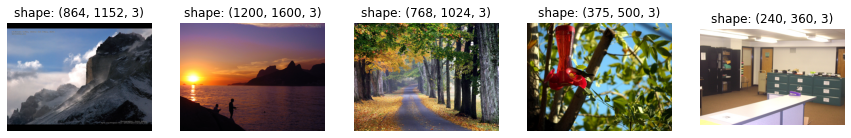

PandaHead


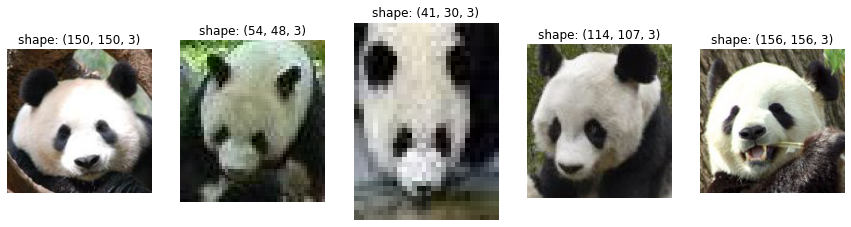

PigHead


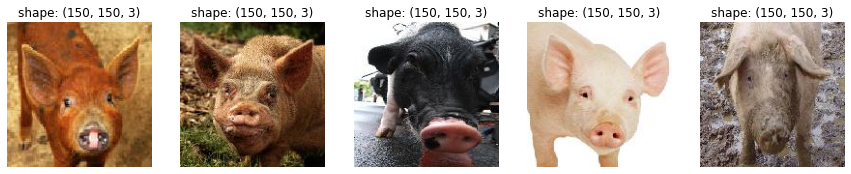

PigeonHead


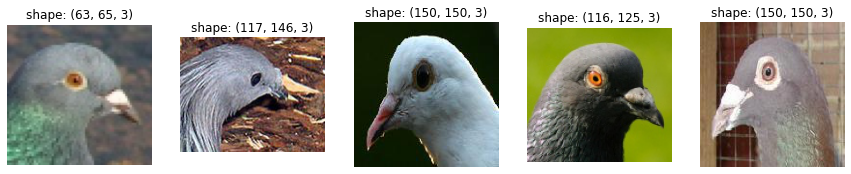

RabbitHead


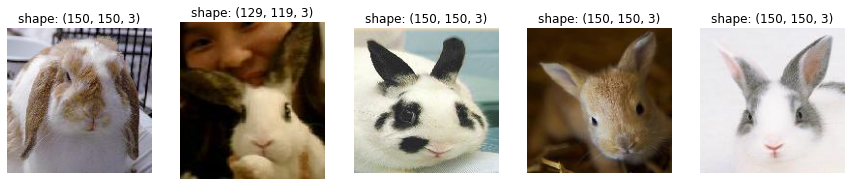

SheepHead


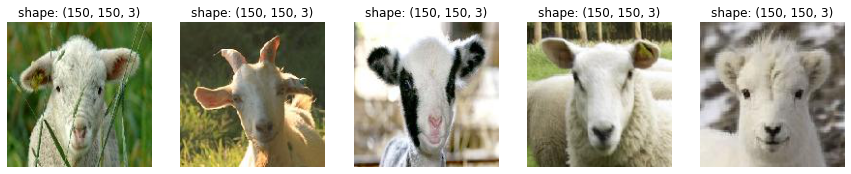

TigerHead


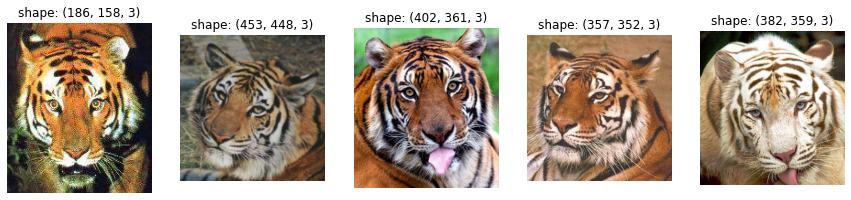

WolfHead


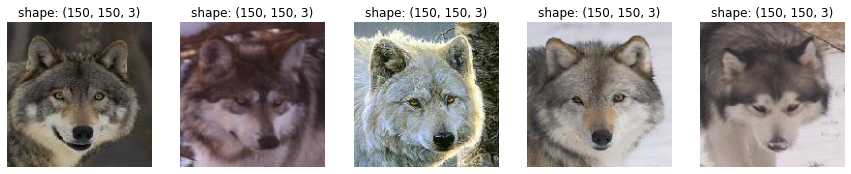

In [18]:
#plot_random_images(target_dir=dataset_dir,target_class='HumanHead')
for class_name in class_names[10:]:
    plot_random_images(target_dir=dataset_dir,target_class=class_name)

a few problems are noticed namely:
1. the images are of different sizes
2. the number of samples in each class is unbalanced
3. the 'natural' class is irrelevant to the rest of the data

in the next section we tackle these problems

### 1.3 Data Analysis and Preparation
the aim here is to remove any problems in the data so it will get the best result in training

remove the natural class and update the class names since its irrelevant to the other categories

In [19]:
import shutil
rm_path=os.path.join(dataset_dir, 'Natural')
shutil.rmtree(rm_path, ignore_errors=True)
print("Deleted '%s' directory successfully" % rm_path)

Deleted 'animal_faces\Image\Natural' directory successfully


In [20]:
class_names=[name for name in class_names if name!='Natural']
print(class_names, len(class_names))

['BearHead', 'CatHead', 'ChickenHead', 'CowHead', 'DeerHead', 'DogHead', 'DuckHead', 'EagleHead', 'ElephantHead', 'HumanHead', 'LionHead', 'MonkeyHead', 'MouseHead', 'PandaHead', 'PigHead', 'PigeonHead', 'RabbitHead', 'SheepHead', 'TigerHead', 'WolfHead'] 20


create the dataframe from all images and filter out any bad files

In [21]:
import os
from PIL import Image
from pathlib import Path
import cv2
import imghdr

df_lst=[]

count_good=0
total=0
for dir_path, dir_name, filenames in os.walk(dataset_dir): 
    for filename in filenames:
        total+=1
        try:
            path = os.path.join(dir_path,filename)
            if not path.lower().endswith(('.png', '.jpg', '.jpeg')): raise Exception("bad format")
            img = cv2.imread(path)
            if img is None: raise Exception("unable to read")
            h, w, _=img.shape
            df_lst.append([filename, dir_path.split('\\')[2], path, w, h])
            count_good+=1
        except Exception as e:
            print('badfile skipping: '+path)
            print(e)
            
print("processed {} files out of {} files successfully".format(count_good, total))

badfile skipping: animal_faces\Image\CatHead\cat1060a.bmp
bad format
badfile skipping: animal_faces\Image\CowHead\cow1.gif
bad format
badfile skipping: animal_faces\Image\PandaHead\Panda4_2jpg
bad format
badfile skipping: animal_faces\Image\TigerHead\tiger-tatiana.gif
bad format
processed 2407 files out of 2411 files successfully


the dataframe was created there were some bad files mostly in the wrong format however panda4_2jpg can be corrected by naming extension properly

create the dataframe from list including width and height columns so we can explore unbalanced image size problem

In [22]:
import pandas as pd
cols=['filename','class_name','filepath','w','h']

In [23]:
#create the dataframe
df= pd.DataFrame(df_lst, columns=cols)
df.sample(n=5)

,filename,class_name,filepath,w,h
17,bearfrontal0018.jpg,BearHead,animal_faces\Image\BearHead\bearfrontal0018.jpg,150,150
147,cat517a.jpg,CatHead,animal_faces\Image\CatHead\cat517a.jpg,204,204
2250,tiger0000000093.jpg,TigerHead,animal_faces\Image\TigerHead\tiger0000000093.jpg,357,357
2082,rabbitfrontalfrontal0089.jpg,RabbitHead,animal_faces\Image\RabbitHead\rabbitfrontalfro...,150,150
112,cat1022a.jpg,CatHead,animal_faces\Image\CatHead\cat1022a.jpg,141,141


visualize the width and height distribution of images in all classes

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

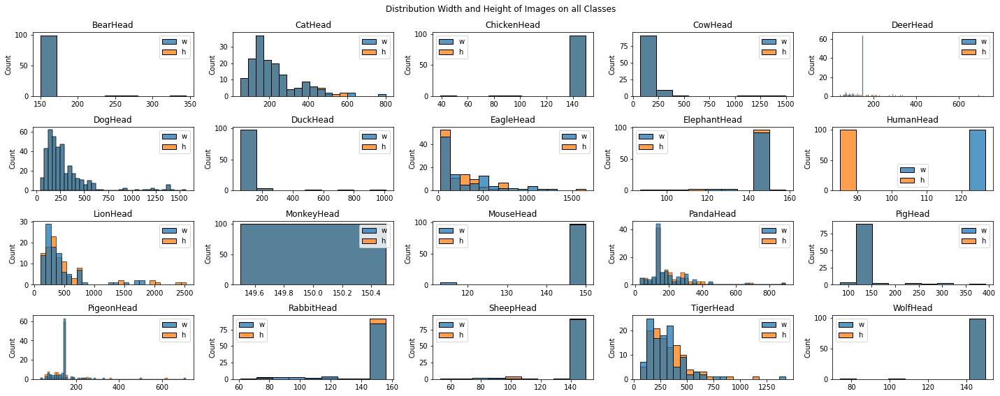

In [25]:
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(20,8))
for i, class_name in enumerate(class_names,1):
    plt.subplot(4,5,i)
    sns.histplot(df.loc[df['class_name'] == class_name]).set(title=class_name)
    
fig.suptitle("Distribution Width and Height of Images on all Classes")
fig.tight_layout()

visualize distribution of width and height across all images

In [26]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Histogram(x=df['w'], name="width distribution"),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=df['h'], name="height distribution"),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="Distribution of width and height across all images")
fig.show()

hovering over the width distribution shows the median width to be 150

get the 100 closest images to size 150 from each class and save in 20 dataframes one for each class

In [27]:
sorted_classes=sort_and_trim(data=df, class_names=class_names, n_records_per_class=100)

created 20 dataframes containing 100 records each successfully


visualizing the sorted dataframes shows that the width distribution is centered around 150 as much as possible particularly noticeable in cathead class 

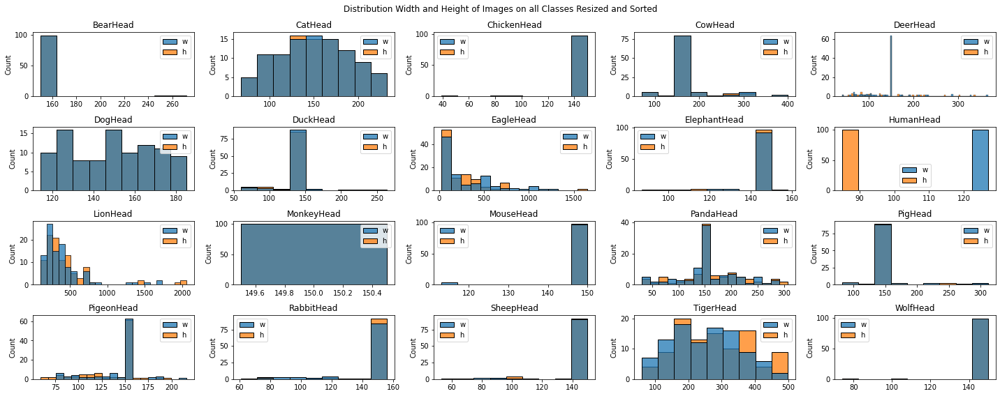

In [28]:
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(20,8))
for i, class_df in enumerate(sorted_classes,1):
    class_name=class_df['class_name'].iloc[0]
    plt.subplot(4,5,i)
    sns.histplot(class_df).set(title=class_name)  

fig.suptitle("Distribution Width and Height of Images on all Classes Resized and Sorted")
fig.tight_layout()

resize the sorted images to 150,150 and move the resized images to new directory

In [29]:
resize_dir=os.path.join(FOLDER_NAME, 'Image_0')
size=150
classes=sorted_classes
resize_to_dir(dataset_dir, resize_dir, sorted_classes, size=size)

resized 2000 images out of 2000 images successfully


visualize the resized images 

BearHead


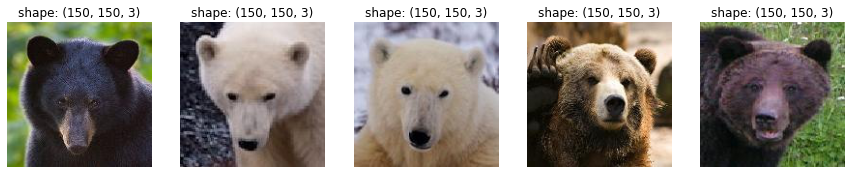

CatHead


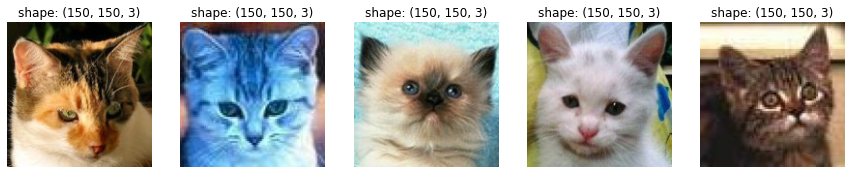

ChickenHead


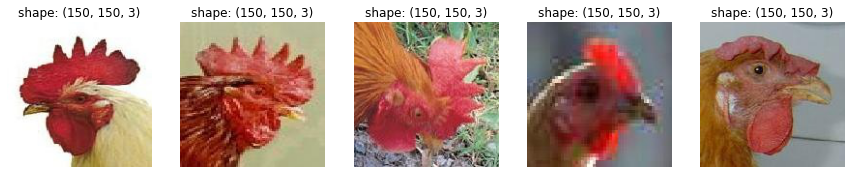

CowHead


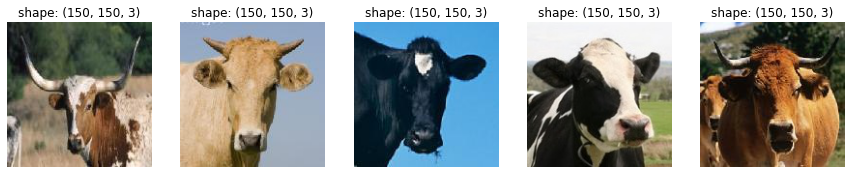

DeerHead


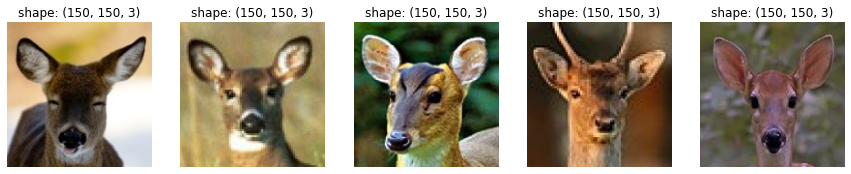

DogHead


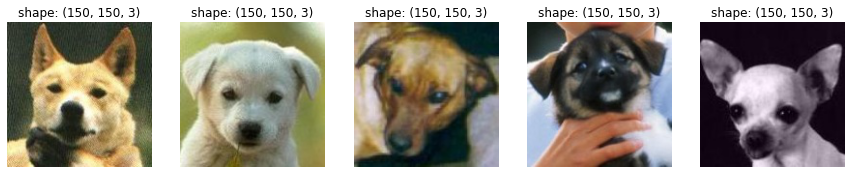

DuckHead


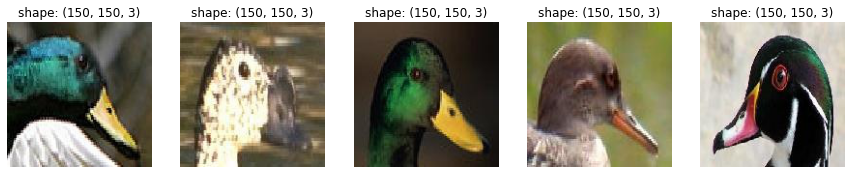

EagleHead


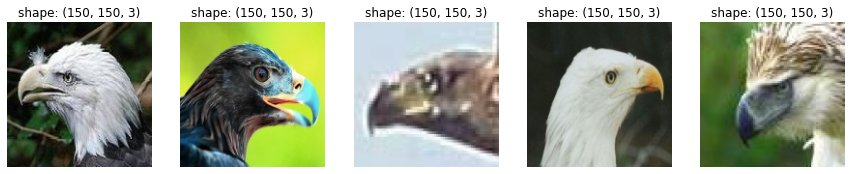

ElephantHead


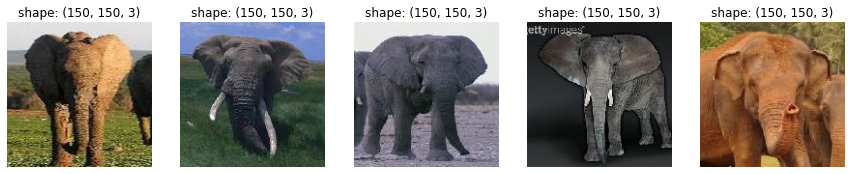

HumanHead


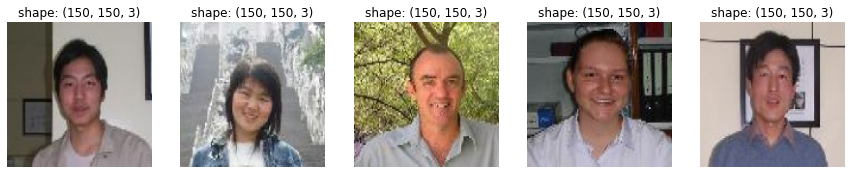

In [30]:
for class_name in class_names[:10]:
    plot_random_images(target_dir=resize_dir,target_class=class_name)

BearHead


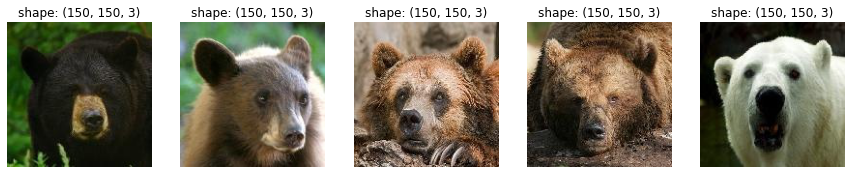

CatHead


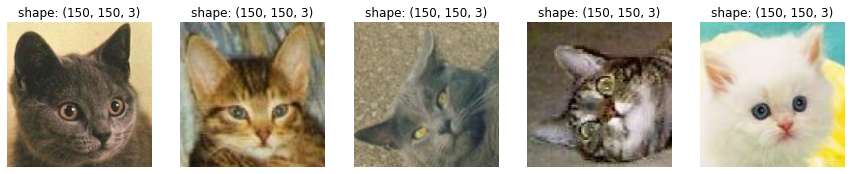

ChickenHead


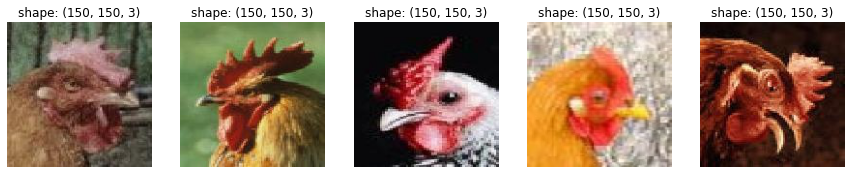

CowHead


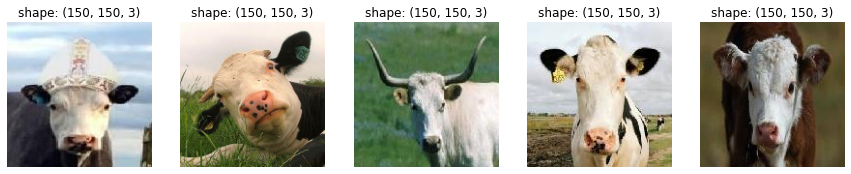

DeerHead


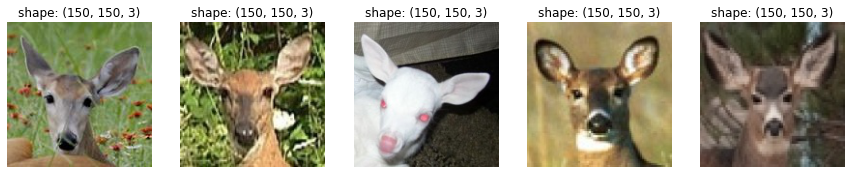

DogHead


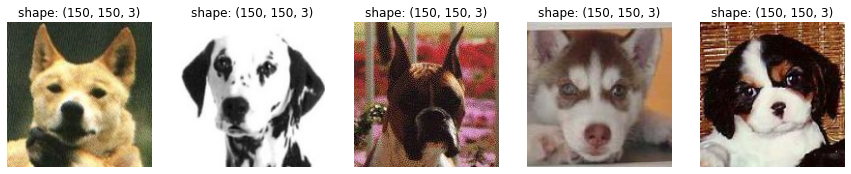

DuckHead


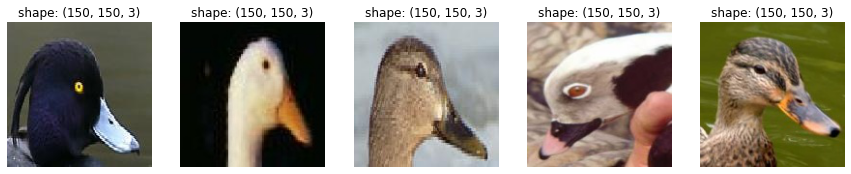

EagleHead


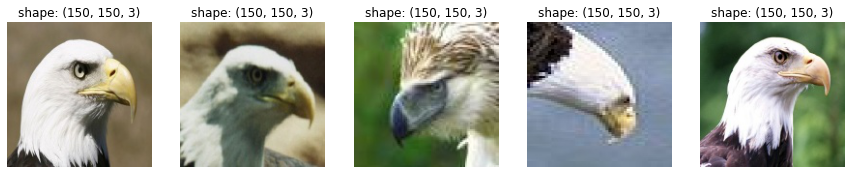

ElephantHead


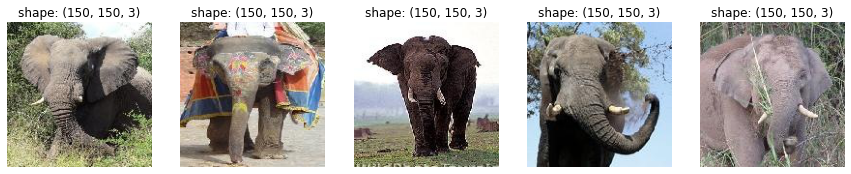

HumanHead


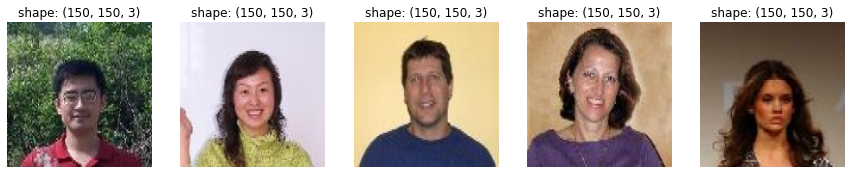

In [31]:
for class_name in class_names[:10]:
    plot_random_images(target_dir=resize_dir,target_class=class_name)

all images are same size and all classes have the same number of images now the data is ready for training

### 1.4 Training
aim of this section is to train the prepared data

create the train and test directory where images will be copied so flow_from_directory can read them

In [32]:
train_dir='train_0'
test_dir='test_0'

copy 100 images per class into train and test directory split by IMAGE_SPLIT which is set to 80train/20test above

In [33]:
to_train_test(resize_dir, class_names, train_dir, test_dir, IMAGE_SPLIT, 1)

get tensorflow for training

In [34]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [36]:
import tensorflow as tf

read in images for training, apply data augmentation and normalization:

Data augmentation introduces artificial noise to the data by randomly modify the image this helps to reduce overfitting on the train data

rescale normalize the image tensor between 0 and 1 normalized data performs better in deep models

test images are not shuffled so confusion matrix can be produced at the end

In [37]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


IMAGE_SHAPE = (150, 150)
BATCH_SIZE = 8


train_datagen = ImageDataGenerator(
                                  #data augmentation  
                                  rescale=1/255.,#normalize images
                                  rotation_range=20,#rotate
                                  width_shift_range=0.2,#shift horizontally
                                  height_shift_range=0.2,#shift vertically
                                  zoom_range=0.2,#randomly zoom images
                                  horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1/255.#normalize test images
                                 )

print("Training images:")
train_data = train_datagen.flow_from_directory(train_dir,
                                               target_size=IMAGE_SHAPE,
                                               batch_size=BATCH_SIZE,
                                               class_mode="categorical")

print("Testing images:")
test_data = train_datagen.flow_from_directory(test_dir,
                                              target_size=IMAGE_SHAPE,
                                              batch_size=BATCH_SIZE,
                                              class_mode="categorical",
                                             shuffle=False)

Training images:
Found 1600 images belonging to 20 classes.
Testing images:
Found 400 images belonging to 20 classes.


early stopping call back will prevent the model from overtraining or overfitting the data by stop the model if the chosen metric stops improving

In [38]:
# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for x epochs
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", # watch the val loss metric
                                                  patience=3) # if val loss decreases for 3 epochs in a row, stop training

we will start with a simple dense model as a baseline

#### 1.4.1 Experiment 1: a simple dense model

In [39]:
#Create the model
model_0 = tf.keras.Sequential([
  tf.keras.layers.Flatten(input_shape=(150, 150, 3)), # input layer (we had to reshape 150x150x3 to 67500, the Flatten layer does this for us)
  tf.keras.layers.Dense(4, activation="relu"),
  tf.keras.layers.Dense(4, activation="relu"),
  tf.keras.layers.Dense(len(class_names), activation="softmax") # output shape is 20, activation is softmax
])

compile an fit the simple dense model

In [40]:
# Compile
model_0.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(), # use Adam with default settings
              metrics=["accuracy"])

# Fit the model
history_0 = model_0.fit(train_data, # now 10 different classes 
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[early_stopping])


Epoch 1/5
200/200 [==============================] - 22s 108ms/step - loss: 2.9989 - accuracy: 0.0444 - val_loss: 2.9957 - val_accuracy: 0.0500
Epoch 2/5
200/200 [==============================] - 14s 71ms/step - loss: 2.9965 - accuracy: 0.0406 - val_loss: 2.9957 - val_accuracy: 0.0500
Epoch 3/5
200/200 [==============================] - 14s 71ms/step - loss: 2.9964 - accuracy: 0.0344 - val_loss: 2.9957 - val_accuracy: 0.0500
Epoch 4/5
200/200 [==============================] - 14s 71ms/step - loss: 2.9964 - accuracy: 0.0300 - val_loss: 2.9957 - val_accuracy: 0.0500
Epoch 5/5
200/200 [==============================] - 14s 71ms/step - loss: 2.9964 - accuracy: 0.0350 - val_loss: 2.9957 - val_accuracy: 0.0500


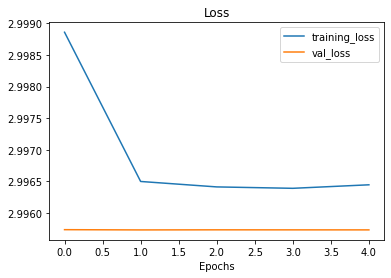

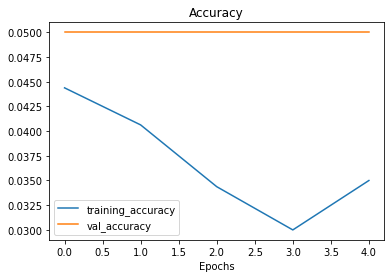

In [41]:
plot_loss_curves(history_0)

accuracy and loss plots show that the dense model did not learn or perform better than random, this is likely because there is no feature extraction done on  the data

#### 1.4.2 Experiment 2: Convolutional Neural Network
section aims to train CNN on the data

In [42]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense

# Create a simple convolutional model
model_1 = Sequential([
  Conv2D(10, 3, activation='relu', input_shape=(150, 150, 3)),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(20, activation='softmax') # softmax activation predict 20 probabilities
])

compile and fit the model for 5 epochs, keep experiments short

In [43]:
# Compile
model_1.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(), # use Adam with default settings
              metrics=["accuracy"])

# Fit the model
history_1 = model_1.fit(train_data, # now 20 different classes 
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[early_stopping])

Epoch 1/5
200/200 [==============================] - 44s 217ms/step - loss: 2.9584 - accuracy: 0.0756 - val_loss: 2.7907 - val_accuracy: 0.1750
Epoch 2/5
200/200 [==============================] - 42s 208ms/step - loss: 2.6831 - accuracy: 0.1981 - val_loss: 2.5092 - val_accuracy: 0.2475
Epoch 3/5
200/200 [==============================] - 47s 235ms/step - loss: 2.4018 - accuracy: 0.2956 - val_loss: 2.4481 - val_accuracy: 0.2675
Epoch 4/5
200/200 [==============================] - 49s 244ms/step - loss: 2.2796 - accuracy: 0.3187 - val_loss: 2.3109 - val_accuracy: 0.2775
Epoch 5/5
200/200 [==============================] - 48s 239ms/step - loss: 2.2081 - accuracy: 0.3419 - val_loss: 2.2175 - val_accuracy: 0.3075


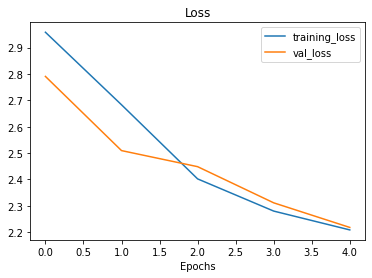

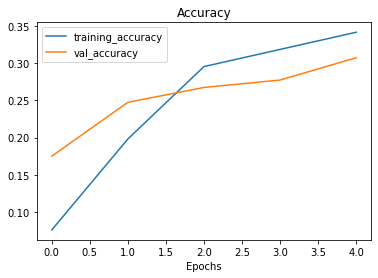

In [44]:
plot_loss_curves(history_1)

loss curves show the convolutional model is learning well on the data due to better feature extraction

#### 1.4.3 Experiment 3: A convolutional neural network with pretrained feature extractor from Tensorflow hub
the section uses a pretrained feature extractor from tensorflow hub to improve performance on the data

import tensorflow hub

tensorflow hub is a website where you can find pretrained models on different types of data

In [51]:
import tensorflow_hub as hub
from tensorflow.keras import layers

we are using the efficient_net feature extractor from hub

In [52]:
efficientnet_url="https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b0/feature_vector/2"

In [53]:
 # Download the pretrained model and save it as a Keras layer
feature_extractor_layer = hub.KerasLayer(efficientnet_url,
                                           trainable=False, # freeze the underlying patterns
                                           name='feature_extraction_layer',
                                           input_shape=IMAGE_SHAPE+(3,)) # define the input image shape

OSError: SavedModel file does not exist at: C:\Users\Nicholas\AppData\Local\Temp\tfhub_modules\053ef6b4dfb0b2a075eb96fcb2f1f7600e6b8e87\{saved_model.pbtxt|saved_model.pb}

the data in this project is highly learnable so there is no need to unfreeze the pretrained layers or add more dense layers so we just create one output layer and fit the pretrained model

In [ ]:
 model_2 = tf.keras.Sequential([
    feature_extractor_layer, # use the feature extraction layer as the base
    layers.Dense(20, activation='softmax', name='output_layer') # create our own output layer      
  ])

In [ ]:
# Compile
model_2.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(), # use Adam with default settings
              metrics=["accuracy"])

# Fit
history_2 = model_2.fit(train_data,
                        epochs=5, # fit for 5 epochs to keep experiments quick
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data), # evaluate on smaller portion of test data
                        callbacks=[early_stopping]) 

In [ ]:
plot_loss_curves(history_2)

the feature extractor model performs very well after 5 epochs

### 1.5 Visualizing the results of all Experiments
here we will predict on images found on internet and view performance of each model on a confusion matrix

In [ ]:
#pred_and_plot(model_0, "test_images", class_names)

In [ ]:
# y_true, y_preds= eval(model_0, test_data)
# make_confusion_matrix(y_true, y_preds, classes=class_names, figsize=(30, 30), text_size=15)

In [ ]:
#pred_and_plot(model_1, "test_images", class_names)

In [ ]:
# y_true, y_preds= eval(model_1, test_data)
# make_confusion_matrix(y_true, y_preds, classes=class_names, figsize=(30, 30), text_size=15)

plot 5 random images found on internet, all the images are saved in test_images directory

In [ ]:
pred_and_plot(model_2, "test_images", class_names)

In [ ]:
y_true, y_preds= eval(model_2, test_data)
make_confusion_matrix(y_true, y_preds, classes=class_names, figsize=(30, 30), text_size=15)

confusion matrix shows the model has very high accuracy overall, though there is notable confusion between dog and cow, sheep and rabbit also cow and sheep

# Part 2 Semantic Analysis 
analysis of yelp reviews data source can be found at

https://www.kaggle.com/code/omkarsabnis/sentiment-analysis-on-the-yelp-reviews-dataset/data

### 2.1 Getting the Data

In [ ]:
import pandas as pd

In [ ]:
#read in the data
df= pd.read_csv('yelp.csv')
df.head()

### 2.2 Data Analysis and Preparation
this section analyse and fix problems with data to improve model performance

remove unnecessary columns

In [ ]:
df=df[["stars", "text"]]
df.head()

10000 records

In [ ]:
len(df.index)

no null values

In [ ]:
df.isnull().sum()

we are going to convert the 5 star rating into three classes of polarity 1-2stars=0/negative polarity, 3stars=1/neutral polarity, 4-5stars=2 positive polarity

we do this by creating new polarity column convert the ratings and append to dataframe

In [ ]:
def stars_to_polarity(x):
    x=int(x)
    if x<3:
        x=0
    elif x==3:
        x=1
    else:
        x=2
    return x

In [ ]:
df['polarity']=df['stars'].apply(lambda x: stars_to_polarity(x))
df.sample(n=5)

lets make some visualizations of rating and polarity distribution

In [ ]:
import plotly as py
import cufflinks as cf

from plotly.offline import iplot

py.offline.init_notebook_mode(connected=True)
cf.go_offline()

In [ ]:
#plot shows frequency distribution of star rating
df['stars'].iplot(kind = 'hist', colors = 'red', bins = 50,
                    xTitle = 'Star Rating', yTitle = 'Count', title  = 'Star Rating Distribution')

In [ ]:
#plot shows frequency distribution of sentiment polarity
df['polarity'].iplot(kind = 'hist', colors = 'red', bins = 50,
                    xTitle = 'Polarity', yTitle = 'Count', title  = 'Sentiment Polarity Distribution')

above shows the first problem in the data is imbalanced samples per class, most reviews are positive which is good for the company but bad for training

we solve this problem by sampling equal number of reviews per class here we chose 1000 because the lowest polarity neutral by hovering over the graph is 1416 samples, by selecting 1000 for each class we will leave at least 416 samples in neutral category for test set

In [ ]:
df_balanced=df.groupby('polarity', group_keys=False).apply(lambda x: x.sample(1000))

visualize balanced classes

In [ ]:
#plot shows frequency distribution of sentiment polarity
df_balanced['polarity'].iplot(kind = 'hist', colors = 'red', bins = 50,
                    xTitle = 'Polarity', yTitle = 'Count', title  = 'Sentiment Polarity Distribution on balanced data')

ready for training

In [ ]:
train_df= df_balanced
train_df.sample(n=5)

create test df from rest of data not in balanced df

In [ ]:
test_df=df.drop(df_balanced.index)
test_df.sample(n=5)

In [ ]:
#plot shows frequency distribution of sentiment polarity
test_df['polarity'].iplot(kind = 'hist', colors = 'red', bins = 50,
                    xTitle = 'Polarity', yTitle = 'Count', title  = 'Sentiment Polarity Distribution on balanced data')

visualize the test set shows at least 416 texts for neutral category

save the train and test dataframe to disk 

In [ ]:
try:
    os.remove('train.csv')
except OSError:
    pass
train_df.to_csv('train.csv', index=False )

In [ ]:
try:
    os.remove('test.csv')
except OSError:
    pass
test_df.to_csv('test.csv', index=False)

load train and test df

In [ ]:
import pandas as pd
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")
train_df.head()

shuffle the training dataframe prevent the model from learning the sequence

In [ ]:
# Shuffle training dataframe
train_df_shuffled = train_df.sample(frac=1) 
train_df_shuffled.head()

In [ ]:
train_df['stars'].value_counts()

In [ ]:
# How many samples total?
print(f"Total training samples: {len(train_df)}")
print(f"Total test samples: {len(test_df)}")
print(f"Total samples: {len(train_df) + len(test_df)}")

visualize some of the training data

In [ ]:
# Let's visualize some random training examples
import random
random_index = random.randint(0, len(train_df)-5) # create random indexes not higher than the total number of samples
for row in train_df_shuffled[["text", "polarity"]][random_index:random_index+5].itertuples():
  _, text, polarity = row
  if polarity == 0:  
      print(f"Rating: {polarity}", "(negative)")
      print(f"Text:\n{text}\n")
  elif polarity == 1:
    print(f"Rating: {polarity}", "(neutral)")
    print(f"Text:\n{text}\n")
  else:
    print(f"Rating: {polarity}", "(positive)")
    print(f"Text:\n{text}\n")
      
print("---\n")

### 2.3 Training

split into train and validation samples 80/20 split

In [ ]:
from sklearn.model_selection import train_test_split

# Use train_test_split to split training data into training and validation sets
train_sentences, val_sentences, train_labels, val_labels = train_test_split(train_df_shuffled["text"].to_numpy(),
                                                                            train_df_shuffled["polarity"].to_numpy(),
                                                                            test_size=0.2) # dedicate 20% of samples to validation set

In [ ]:
# Check the lengths
len(train_sentences), len(train_labels), len(val_sentences), len(val_labels)

#### 2.3.1 Experiment 1: Multinomial Naive Bayes Classifier
the section fit mnb classifier to the train data

the pipeline vectorizers the data first before classify, vectorizer means to transform the text sentences into a tensor of numbers

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline

# Create tokenization and modelling pipeline
model_3 = Pipeline([
                    ("tfidf", TfidfVectorizer()), # convert words to numbers using tfidf
                    ("clf", MultinomialNB()) # model the text
])

# Fit the pipeline to the training data
model_3.fit(train_sentences, train_labels)

model performs significantly better than random

In [ ]:
baseline_score = model_3.score(val_sentences, val_labels)
print(f"Our baseline model achieves an accuracy of: {baseline_score*100:.2f}%")

make predictions on the validation set

In [ ]:
# Make predictions
baseline_preds = model_3.predict(val_sentences)
baseline_preds[:10]

In [ ]:
# Get baseline results
baseline_results = calculate_results(y_true=val_labels,
                                     y_pred=baseline_preds)
baseline_results

high precision shows the model has a good understanding of the categories and is able to predict positives well

### 2.4 Visualizing and understanding the results

In [ ]:
# Create dataframe with validation sentences and naive model predictions
val_df = pd.DataFrame({"text": val_sentences,
                       "target": val_labels,
                       "pred": baseline_preds})
val_df.head()

get subset of the dataframe to visualize some wrong predictions

In [ ]:
# Find the wrong predictions
wrong = val_df[val_df["target"] != val_df["pred"]]
wrong[:10]

view first 10 wrong predictions and try gain some insight on the wrong predictions

In [ ]:
# Check the first 10 wrong predictions
for row in wrong[:10].itertuples(): # loop through the top 10 rows (change the index to view different rows)
  _, text, target, pred = row
  print(f"Target: {target}, Pred: {pred}")
  print(f"Text:\n{text}\n")
  print("----\n")

by inspecting some of the misprediction you can get insight into what the model is struggling with, some of the reviews tended to be very long and complex so an sequence model like RNN LSTM would likely improve performance by preserving context over the length of the review

make some predictions on the test dataframe

In [ ]:
import random
# Making predictions on the test dataset
test_sentences = test_df[["text","polarity"]].values.tolist()
test_samples = random.sample(test_sentences, 10)
for test_sample in test_samples:
  pred = model_3.predict([test_sample[0]])
  print(f"Pred: {pred} | actual label: {test_sample[1]}")
  print(f"Text:\n{test_sample[0]}\n")
  print("----\n")

### 2.5 Predicting on random sentences

1. prediction 0= negative polarity
2. prediction 1= neutral polarity
3. prediction 2= positive polarity

define function to predict on custom sentences

In [ ]:
def predict_custom(text, model=model_3):
    pred = model.predict([text])
    print(f"Pred: {pred}")
    print(f"Text:\n{text}\n")
    print("----\n")

In [ ]:
pos_sample="the food is good 10/10 would recommend lovely yay"

In [ ]:
neg_sample = "this is bad very bad product i hate this negative product horrible never"

In [ ]:
neut_sample = "good but could be better"

predict on custom sentences

In [ ]:
predict_custom(pos_sample)

In [ ]:
#predict_custom(neut_sample)

In [ ]:
#predict_custom(neg_sample)

overall the model is very good at understanding the classes, however when the sentences get longer and more complex the model struglles, and improvement to this model will be to use a LSTM or other sequence that can preserve the meaning or context of the review throughut length of the text